In [1]:
import json
from pprint import pprint
from termcolor import colored
from colored import fg, bg, attr
import numpy as np
import matplotlib.pyplot as plt
from collections import Counter
import warnings
warnings.filterwarnings('ignore')

# if using a Jupyter notebook, includue:
%matplotlib inline
data_file = "../notebook/predictor_result/predictor_bert_only_head_entity.jsonl"
id2name = "../data/id2name.json"

color = bg('yellow_1') + fg('black')
reset = attr('reset')
blue = "blue"
green = "green"

print()

with open(id2name, 'r') as fp:
    id2name = json.load(fp)


In [2]:
def change_word_by_entity(entity_str, this_sentence,i,color):
        if list(map(lambda x: x.lower(), this_sentence[i:i + len(entity_str.split(" "))])) == entity_str.split():
            this_sentence = this_sentence[:i] + [colored(w, color, attrs=['bold']) for w in entity_str.split()] + \
                            this_sentence[i + len(entity_str.split(" ")):]
        return this_sentence


In [3]:
preffix = ""
def _show_sentence(head,tail,this_sentence,relation,correct_relation = None, is_prediction = False,prob : str = "",score: str = ""):
    print(preffix + "head:", colored(head, 'blue', attrs=['bold']), "  ,  ", "tail", colored(tail, 'green', attrs=['bold']))          
    this_sentence = this_sentence.split()
    for i, word in enumerate(this_sentence):
            if word.lower() == head.split()[0]:
                this_sentence = change_word_by_entity(head, this_sentence,i,blue)
            if word.lower() == tail.split()[0]:
                this_sentence = change_word_by_entity(tail, this_sentence,i,green)
    color = 'yellow' if correct_relation is None or relation == correct_relation else 'grey'
    if is_prediction: color = "red"
    if len(prob) > 0:
        print(preffix + colored(relation, color,attrs=['bold']) + "\t", " ".join(this_sentence) +" " + colored(prob, "magenta",attrs=['bold'])+"; "+ 
              colored(score, "magenta",attrs=['bold']))
    else:
        print(preffix + colored(relation, color,attrs=['bold']) + "\t", " ".join(this_sentence))

In [4]:
def show_set(data):
    correct_relation = data['correct_relation']
    prediction = data["prediction"]
    query = data['query']
    head = data['query_head']
    tail = data['query_tail']
    probability = data['probability'].replace("'","")[1:-1].split(",")
    scores = data['scores']
    _show_sentence(head,tail,query,correct_relation)
    print()

    for k in range(5):
        this_sentence = data["sentence_" +str(k)]
        head = data['sentence_'+str(k)+'_head']
        tail = data['sentence_'+str(k)+'_tail']
        relation = data['sentence_'+str(k)+'_relation']
        _show_sentence(head,tail,this_sentence,relation,correct_relation,  k == int(prediction),probability[k],
                       "{:.2f}".format(scores[k]))
    print()
    return correct_relation
        

In [5]:
total_wrong = 0
total_correct = 0
result_per_type = {}
correct_scroes = []
wrong_scores = []
pred_list = []
gold_list = []
wrong_prediction_which_rel = {}
with open(data_file) as f:
    for ex_index,line in enumerate(f,1):
        data = json.loads(line)
        scores = data['scores']
        pred_rel = data['sentence_' + data["prediction"] +'_relation']
        pred_score = scores[int(data["prediction"])]
        the_gold_rel = data['correct_relation']
        gold_list.append(the_gold_rel)
        pred_list.append(pred_rel)
        if data['answer'] == "wrong":
            assert pred_rel != the_gold_rel
            if not the_gold_rel in wrong_prediction_which_rel:
                wrong_prediction_which_rel[the_gold_rel] = Counter()
            wrong_prediction_which_rel[the_gold_rel].update([pred_rel])
            total_wrong +=1
            print("wrong example number: ",total_wrong,  "example number: ", ex_index)
            show_set(data)
            print()
            wrong_scores.append(pred_score)
            result_per_type[the_gold_rel] = result_per_type.get(the_gold_rel,[[],[]])
            result_per_type[the_gold_rel][0].append(data)
            
            
        else:
            result_per_type[the_gold_rel] = result_per_type.get(the_gold_rel,[[],[]])
            result_per_type[the_gold_rel][1].append(data)
            correct_scroes.append(pred_score)
            total_correct +=1





wrong example number:  1 example number:  1
head: european union   ,   tail european economic area
member of	 Being member of european economic area ( EEA ) , Norway implemented the european union directive 2002/24/EC .

head: benoît laffineur   ,   tail swimmer
sport	 benoît laffineur ( born 30 October 1957 ) is a French former swimmer . 0.05; 19.20
head: 2009 general elections   ,   tail 2006
follows	 Wilson was re - elected in the 2003 , 2006 , and 2009 general elections .  0.25; 20.83
head: lord may of oxford   ,   tail royal society
member of	 The inaugural Lord Lewis Prize was awarded to lord may of oxford , former President of the royal society and Chief Scientific Advisor to the UK Government , in 2008 .  0.24; 20.82
head: brunhilda   ,   tail goiswintha
mother	 In 579 , her stepson Hermenegild married her granddaughter Ingund , daughter of goiswintha 's daughter brunhilda by the Frankish king Sigebert I.  0.19; 20.55
head: the autocrats   ,   tail finnish
original language of 

child	 Finally a Hittite army conquered the capital Washukanni and installed shattiwaza , the son of tushratta , as their vassal king of Mitanni in the late 14th century BC . 0.03; 20.59
head: anji bridge   ,   tail xiao river
crosses	 The first open - spandrel segmental arch bridge is the anji bridge over the xiao river in Hebei Province in China , which was built in 610 AD .  0.01; 19.29
head: verviers   ,   tail liège
part of	 The composer César Franck was born in liège in 1822 , Guillaume Lekeu in verviers .  0.01; 19.28
head: madden nfl   ,   tail american football
sport	 " madden nfl Superstars " is a spin - off of the popular " madden nfl " american football video game series .  0.03; 20.67
head: john cecil currie   ,   tail brigadier
military rank	 brigadier john cecil currie ( 1898 – 26 June 1944 ) was a British Army officer who fought in both World War I and World War II .  0.92; 23.97


wrong example number:  58 example number:  102
head: cecile of baux   ,   tail beatrice
c

head: ucam murcia   ,   tail basketball
sport	 Clevin Finley Hannah ( born November 15 , 1987 ) is an American - Senegalese professional basketball player who plays for ucam murcia of the Spanish Liga ACB .  0.12; 20.83


wrong example number:  107 example number:  188
head: ni zhiliang   ,   tail lieutenant general
military rank	 ni zhiliang ( ) ( October 1900 – December 15 , 1965 ) was a People 's Republic of China diplomat and People 's Liberation Army lieutenant general .

head: lamar russ   ,   tail middleweight
competition class	 lamar russ ( born January 15 , 1987 in Tallahassee , Florida ) is an American professional boxer in the middleweight division . 0.41; 23.74
head: "event horizon"   ,   tail wormhole
main subject	 In the movie " Event Horizon " , the titular ship is designed to create an artificial wormhole .  0.02; 20.60
head: wacław rzewuski   ,   tail konstancja małgorzata lubomirska
mother	 He was married to konstancja małgorzata lubomirska and had three children , wa

head: robert marsland groves   ,   tail air commodore
military rank	 air commodore robert marsland groves , ( 3 January 1880 – 27 May 1920 ) was a Royal Navy officer involved with naval aviation during the First World War .  0.06; 22.32
head: karey dornetto   ,   tail jamie babbit
spouse	 " Addicted to Fresno " was karey dornetto 's first feature - length screenplay and was written with the intent of being directed by wife jamie babbit .  0.31; 23.99
head: tyler kroft   ,   tail american football
sport	 tyler kroft ( born October 15 , 1992 ) is an american football tight end for the Cincinnati Bengals of the National Football League ( NFL ) .  0.31; 24.01
head: geraint evans   ,   tail bass
voice type	 It is said that he had a considerable rivalry with Welsh bass - baritone geraint evans .  0.32; 24.05


wrong example number:  169 example number:  291
head: lavar ball   ,   tail liangelo ball
child	 The Big Baller Brand International Tournament was sponsored by Big Baller Brand , a spo

head: tihamah   ,   tail red sea
located in or next to body of water	 On the red sea coast , there is a narrow coastal plain , known as the tihamah parallel to which runs an imposing escarpment .

head: point pinos   ,   tail monterey bay
located in or next to body of water	 This species was described from point pinos , monterey bay , California , United States . 0.26; 22.02
head: melissa ferlaak   ,   tail soprano
voice type	 After Nicole left the band , she was replaced by American soprano singer melissa ferlaak ( formerly with Aesma Daeva ) and Wolfgang Koch replaced Werner Fiedler .  0.10; 21.01
head: bridge to nowhere   ,   tail san gabriel river
crosses	 Notable hiking in the area includes Heaton Flat along the East Fork of the san gabriel river to bridge to nowhere .  0.29; 22.11
head: wanli emperor   ,   tail taichang emperor
child	 The wanli emperor died on 18 August 1620 and the taichang emperor succeeded him .  0.29; 22.10
head: carolyn cassady   ,   tail neal cassady
spouse

wrong example number:  286 example number:  513
head: clive steele   ,   tail major general
military rank	 O'Brien and the Engineer - in - Chief , major general clive steele , left Melbourne on 5 August 1944 on a tour of ordnance plants in the United States , Canada and Britain .

head: james henry gillis   ,   tail rear admiral
military rank	 james henry gillis ( 14 May 1831 – 6 December 1910 ) was a rear admiral in the United States Navy . 0.22; 22.59
head: brendan doran   ,   tail ski jumper
sport	 brendan doran ( born March 17 , 1979 ) is an American former ski jumper who competed in the 1998 Winter Olympics and in the 2002 Winter Olympics .  0.26; 22.75
head: anak dalita   ,   tail tagalog
original language of film or TV show	 Ang mga anak dalita ( " [ The ] Children of the Poor " ) is a 1911 tagalog - language novel written by Filipino novelist Patricio Mariano .  0.16; 22.28
head: argo   ,   tail iran hostage crisis
main subject	 In late 2012 , he appeared in Affleck 's film " a

head: bhakta prahlada   ,   tail telugu
original language of film or TV show	 The first telugu film with audible dialogue , " bhakta prahlada " , was produced by H.M. Reddy , who directed the first South Indian talkie Kalidas ( 1931 ) .  0.38; 22.12
head: eyüp can   ,   tail flyweight
competition class	 There he was defeated in the first round of the men 's flyweight ( – 51 kg ) division by Turkey 's eventual bronze medalist eyüp can .  0.12; 20.97
head: great war   ,   tail southern victory
part of	 In the " great war " trilogy , which makes up part of the southern victory series , Roosevelt leads the United States to victory over the Confederated States of America .  0.00; 17.55
head: pangbourne   ,   tail river thames
located in or next to body of water	 The River Pang flows north through the village on its way to join the river thames at pangbourne .  0.07; 20.44


wrong example number:  348 example number:  632
head: catherine bagration   ,   tail pyotr bagration
spouse	 Lord Howd

wrong example number:  414 example number:  753
head: summer of my german soldier   ,   tail world war ii
main subject	 4501 appears several times in the 1978 movie " summer of my german soldier " , set in Georgia during world war ii .

head: nba street   ,   tail basketball
main subject	 " nba street " consists of three - on - three basketball games . 0.14; 20.18
head: petit martinique   ,   tail caribbean sea
located in or next to body of water	 The middle section depicts the caribbean sea and the islands of his diocese ( Grenada , Carriacou and petit martinique ) .  0.45; 21.36
head: 2011   ,   tail 2010
follows	 In 2010 he presented " " , an RTÉ reality talent competition , and in 2011 he presented " The Genealogy Roadshow " .  0.09; 19.73
head: johnathan haggerty   ,   tail wide receiver
position played on team / speciality	 johnathan haggerty ( born February 5 , 1988 ) is an American football wide receiver who is currently a free agent .  0.15; 20.27
head: 3rd canadian division  

head: florence adele vanderbilt   ,   tail hamilton mckown twombly
spouse	 It was built by hamilton mckown twombly and his wife , florence adele vanderbilt , a member of the Vanderbilt family .  0.96; 24.37
head: raimo   ,   tail volleyball
sport	 Her older brother raimo is a former volleyball player who played professionally in Estonia , Austria , Belgium and France .  0.02; 20.45


wrong example number:  474 example number:  865
head: ian laperrière   ,   tail winger
position played on team / speciality	 ian laperrière ( born January 19 , 1974 ) is a Canadian former professional ice hockey winger who played 16 seasons in the National Hockey League ( NHL ) .

head: tony bennett   ,   tail linebacker
position played on team / speciality	 Bennett is the nephew of former Green Bay Packers and Indianapolis Colts linebacker / defensive end tony bennett . 0.43; 23.97
head: natalia kukulska   ,   tail anna jantar
mother	 anna jantar - Kukulska ( born Anna Maria Szmeterling ; 10 June 1950 – 1

main subject	 During the events of " the fast and the furious " , Brian is undercover for an lapd - FBI task force under the alias Brian Spilner .  0.02; 20.34
head: diego costa   ,   tail striker
position played on team / speciality	 striker diego costa is banned for a stamp on Liverpool midfielder Emre Can , meaning he will miss games against Manchester City , Aston Villa and Everton .  0.32; 23.29
head: elada   ,   tail bres
child	 In Irish mythology , Elatha or elada ( modern spelling : Ealadha ) was a king of the Fomorians and the father of bres by Ériu of the Tuatha Dé Danann .  0.02; 20.52
head: frederick alfred pile   ,   tail general
military rank	 general Sir frederick alfred pile , 2nd Baronet , ( 14 September 1884 – 14 November 1976 ) was a senior British Army officer who served in both World Wars .  0.64; 23.99


wrong example number:  541 example number:  982
head: locals   ,   tail english
original language of film or TV show	 locals referred to its locomotives as " toro


wrong example number:  600 example number:  1092
head: catherine jagellonka   ,   tail john iii of sweden
spouse	 john iii of sweden married catherine jagellonka , the sister of Sigismund II Augustus of Poland .

head: jordan shipley   ,   tail receivers
position played on team / speciality	 The leading receivers through 11 games were jordan shipley ( 897 yards ) , Quan Cosby ( 872 ) , Chris Ogbonnaya ( 458 ) and Lucas Hampton ( 428 ) . 0.61; 24.07
head: vigilantia   ,   tail praejecta
child	 Marcellus was the son of vigilantia , the sister of Justinian , and Dulcidio ( or Dulcissimus ) , and thus the brother of Justin II and praejecta .  0.01; 19.99
head: asenath   ,   tail joseph
spouse	 After seven years of plenty , the famine begins just as joseph predicted , by which time asenath has given joseph two sons , Manasseh and Ephraim .  0.35; 23.52
head: hannibal rising   ,   tail serial killer
main subject	 He also produced the prequel " hannibal rising " ( 2007 ) , which tells the st

head: cornelia metella   ,   tail pompey
spouse	 At the theater that night , Scipio introduces his daughter cornelia metella to pompey as a prospective wife , while Cato warns him that he must ally against Caesar before it is too late .

head: homr   ,   tail twelfth season
part of	 " homr " ( styled as " HOMЯ " ) is the ninth episode of the twelfth season of the American animated sitcom " The Simpsons " . 0.06; 20.47
head: günter reich   ,   tail baritone
voice type	 günter reich ( 22 November 1921 – 15 January 1989 ) , also spelled Günther Reich and Gunther Reich , was an Israeli baritone of German birth .  0.24; 21.79
head: marco i sanudo   ,   tail angelo sanudo
child	 A History of Frankish Greece ( 1204–1566 ) " by William Miller , the seven brothers may also have had a sister , the wife of marco i sanudo and mother of angelo sanudo .  0.39; 22.29
head: mandane   ,   tail cambyses i
spouse	 On their advice , Astyages sent Cyrus to his parents , cambyses i and mandane , in Anšan ( 

head: richard   ,   tail samuel more
child	 In 1616 , samuel more accused his wife of adultery and , at the direction of his father , richard , devised a plan to rid himself of Katherine and the children .  0.11; 23.08
head: klaus lange   ,   tail handball
sport	 klaus lange ( born September 14 , 1939 ) is a former West German handball player who competed in the 1972 Summer Olympics .  0.49; 24.54


wrong example number:  729 example number:  1357
head: jeff chandler   ,   tail bantamweight
competition class	 Canizales turned pro in 1979 and in 1983 challenged jeff chandler for the World Boxing Association ( WBA ) bantamweight title but lost a decision .

head: the four books   ,   tail hadith
main subject	 160 - 9 Dar al - Ma'aarif edition Another famous source(s ) of hadiths is known as the four books , which Shias consider as the most authentic hadith reference . 0.02; 21.10
head: linear b   ,   tail linear a
follows	 linear a served as the foundation for linear b , which recorded t

voice type	 anton dermota sang as a tenor as Alfred in " Die Fledermaus " in the 1950 London Gramophone recording LLP 305 . 0.32; 23.43
head: total siyappa   ,   tail hindi
original language of film or TV show	 Her second hindi film was Eeshwar Nivas 's " total siyappa " , opposite Ali Zafar , produced by Reliance Entertainment and Neeraj Pandey , which was released in 2014 .  0.06; 21.69
head: andre berto   ,   tail welterweight
competition class	 andre berto vs. Victor Ortiz was a welterweight world title fight that aired on HBO 's " Boxing After Dark " on April 16 , 2011 .  0.36; 23.54
head: ice cold in alex   ,   tail second world war
main subject	 Thompson had a big success with " ice cold in alex " ( 1958 ) , the story of a British Army unit trekking across North Africa in the second world war .  0.02; 20.57
head: frederick   ,   tail eleanor
mother	 Younger brother and successor of frederick , he was a minor upon his succession and was under the tutelage of his mother eleanor . 

head: dražen bagarić   ,   tail forward
position played on team / speciality	 dražen bagarić ( born 12 November 1992 ) is a Croatian professional footballer who plays for Široki Brijeg as a forward .  0.04; 18.94
head: elisabeth höngen   ,   tail mezzo-soprano
voice type	 elisabeth höngen ( 7 December 1906 , Gevelsberg – 7 August 1997 , Vienna ) was a German operatic mezzo - soprano and singing - actress .  0.07; 19.58
head: margaret   ,   tail queen elizabeth
mother	 His wife , queen elizabeth , and daughters , Princesses Elizabeth and margaret , were also present for the ceremony . Royal Tour 1947 , British Pathé .  0.49; 21.56


wrong example number:  853 example number:  1614
head: kaaka muttai   ,   tail tamil-language
original language of film or TV show	 kaaka muttai ( English : " Crow Eggs " ) is a 2015 Indian Tamil - language comedy - drama film written , directed and filmed by M. Manikandan .

head: john fane, 10th earl of westmorland   ,   tail sarah anne child
spouse	 Rober

head: abigail   ,   tail chileab
child	 According to Rashi , Rabbi Isaac said that some questioned whether abigail was pregnant through David or her first husband , Nabal ; therefore , God arranged that chileab would resemble David .  0.67; 22.66
head: marcela acuña   ,   tail featherweight
competition class	 Anyos holds multiple World titles in boxing , including winning the first ever WBC World female featherweight title in 2005 against marcela acuña .  0.08; 20.57


wrong example number:  916 example number:  1716
head: issam zahreddine   ,   tail brigadier general
military rank	 He commanded the 104th brigade that is located in Douma and Harasta in the Republican Guard together with brigadier general issam zahreddine .

head: quaestors   ,   tail parliament
member of	 The parliament elects five quaestors for a two and a half - year term . 0.13; 21.76
head: ancient artifacts   ,   tail horse bites dog cries
follows	 until 1987 , playing on the albums " ancient artifacts " ( 1985 ) a

head: due south   ,   tail chicago police department
main subject	 Beau Starr 's well - known television role was in the 1990s Canadian television series " due south " as Lieutenant Harding Welsh of the chicago police department .  0.52; 22.49
head: hayman hayman-joyce   ,   tail major general
military rank	 In early September , however , shortly after returning to England , Berney - Ficklin became GOC of the 48th Infantry ( Reserve ) Division , succeeding major general Hayman Hayman - Joyce .  0.07; 20.45
head: cambrian   ,   tail ediacaran
follows	 The last one is made up ediacaran ( Vendian ) , cambrian , Ordovician and Silurian - aged sedimentary rocks .  0.21; 21.56
head: frederick iii   ,   tail eleanor of portugal
spouse	 In 1452 he was in Rome at the wedding of frederick iii with eleanor of portugal .  0.06; 20.40


wrong example number:  990 example number:  1849
head: marvellous   ,   tail stoke city
main subject	 Macari was portrayed by Scottish actor Tony Curran in the 2014

head: brecon   ,   tail river usk
located in or next to body of water	 It rises on Mynydd Epynt and flows southwards to join the river usk at brecon ( ) .  0.36; 22.49
head: kiel mcleod   ,   tail ice hockey
sport	 kiel mcleod ( born December 30 , 1982 ) is a Canadian professional ice hockey centre who is currently an unrestricted free agent .  0.04; 20.40
head: tulsi   ,   tail hindi
original language of film or TV show	 The film was also remade in hindi as " tulsi " .  0.37; 22.53


wrong example number:  1053 example number:  1982
head: aidondla aidu   ,   tail kannada language
original language of film or TV show	 aidondla aidu ( ) is a 2011 Indian kannada language anthology drama film directed by V. K. Prakash and produced by Vachan Shetty and Sujitha Prakash .

head: unity bridge   ,   tail ruvuma river
crosses	 The initiative to build this bridge , across the ruvuma river at Negomano , also known as the " unity bridge 1 " began in 1975 . 0.10; 20.40
head: aur island   ,   tail s

head: ebenezer sproat   ,   tail colonel
military rank	 ebenezer sproat was promoted to colonel during September 1783 , shortly before the end of his eight and one - half years of service in the Continental Army .  0.00; 16.06
head: allen iverson   ,   tail point guard
position played on team / speciality	 Combo guards became prominent in the 1990s , when players such as allen iverson and Penny Hardaway were switched between playing point guard and shooting guard , depending on offensive and defensive situations .  0.01; 16.43


wrong example number:  1116 example number:  2078
head: østensjø line   ,   tail oslo metro
part of	 Ulsrud is a station on the østensjø line ( Line 3 ) on the oslo metro , located between the stations of Oppsal and Bøler , from Stortinget .

head: 33 arietis   ,   tail aries
constellation	 It was made up of a small group of stars , now called 33 arietis , 35 Arietis , 39 Arietis , and 41 Arietis , in the north of the constellation of aries . 0.43; 22.43
head: 

head: eleanor of provence   ,   tail henry iii of england
spouse	 eleanor of provence , Queen consort of henry iii of england , died in Amesbury on 24 or 25 June 1291 , and was buried in the abbey on 11 September 1291 .  0.24; 23.47


wrong example number:  1179 example number:  2194
head: keetje tippel   ,   tail dutch
original language of film or TV show	 Katie Tippel ( dutch title : keetje tippel ) is a 1975 film by Paul Verhoeven .

head: kumki   ,   tail tamil
original language of film or TV show	 kumki is the tamil name for captive , trained Indian elephants . 0.03; 20.80
head: victor beamish   ,   tail group captain
military rank	 Five days later group captain victor beamish arrived as the new station commander .  0.25; 22.94
head: hot metal bridge   ,   tail monongahela river
crosses	 Within the city , the GAP goes from the Waterfront Mall and Sandcastle upstream on the monongahela river , and then at the South Side Works crosses the river on the hot metal bridge .  0.02; 20.21

constellation	 61 virginis c ( abbreviated 61 Vir c ) is an exoplanet orbiting the 5th apparent - magnitude G - type main - sequence star 61 virginis in the constellation virgo .  0.01; 21.08
head: lady joan fitzgerald   ,   tail james butler, 9th earl of ormond
spouse	 In August 1548 , he married lady joan fitzgerald , the widow of James Butler , 9th Earl of Ormond , and the mother of seven sons .  0.12; 23.20
head: peter kajlinger   ,   tail baritone
voice type	 peter kajlinger ( born 2 December 1964 ) is a Swedish operatic baritone .  0.36; 24.26
head: damon elliott   ,   tail dionne warwick
mother	 damon elliott was born on March 21 , 1973 to dionne warwick and Bill Elliott .  0.32; 24.14


wrong example number:  1251 example number:  2356
head: aeronwy   ,   tail caitlin
mother	 Dylan and caitlin brought up their three children , aeronwy , Llewellyn and Colm .

head: maddan   ,   tail guendolen
mother	 Locrinus cast aside his wife , guendolen , and their son maddan and acknowledge

head: abuse me   ,   tail freak
follows	 The album reached number 1 in the Australian charts and yielded three Top 10 singles – " freak " , " abuse me " and " Cemetery " .

head: barbara bach   ,   tail francesca gregorini
child	 From 2001 to 2004 , de Rossi dated director francesca gregorini , the daughter of barbara bach and the stepdaughter of Ringo Starr . 0.26; 21.42
head: 1920   ,   tail 1912
follows	 He competed at the 1908 , 1912 , 1920 , and 1924 Summer Olympics and won three silver and one bronze medals .  0.14; 20.83
head: klaus könig   ,   tail tenor
voice type	 klaus könig ( b : May 26 , 1934 in Beuthen , Upper Silesia ) is a German tenor opera singer .  0.08; 20.20
head: miyabi natsuyaki   ,   tail berryz kobo
member of	 with Momoko Tsugunaga and miyabi natsuyaki from berryz kobo .  0.30; 21.58
head: steffen büttner   ,   tail defender
position played on team / speciality	 steffen büttner ( born 2 November 1963 ) is a German former footballer who played as a defender .  0

head: grimsby   ,   tail lincolnshire
part of	 Ian Kevin Huntley was born in grimsby , lincolnshire , on 31 January 1974 , the first son of Kevin and Linda Huntley . 0.05; 22.29
head: john curtiss   ,   tail air marshal
military rank	 air marshal Sir john curtiss was appointed air component commander , and Major General Jeremy Moore , land component commander .  0.28; 24.05
head: minkhaung   ,   tail thihathu
child	 In response , minkhaung recalled Minye Kyawswa to Ava , and sent his middle son thihathu to Prome to take over as viceroy .  0.21; 23.76
head: gianna pederzini   ,   tail mezzo-soprano
voice type	 In Italy , mezzo - soprano gianna pederzini helped Dryden to complete his studies with the baritone Gino Bechi in Florence .  0.47; 24.57
head: highway 25 bridge   ,   tail mississippi river
crosses	 The route crosses the highway 25 bridge at the mississippi river between Monticello and Big Lake .  0.00; 18.49


wrong example number:  1369 example number:  2565
head: terminal isla

competition class	 His performance set him up to fight carlos baldomir , in a title defense by Baldomir for the WBC international welterweight title .  0.19; 23.08


wrong example number:  1442 example number:  2729
head: saratov bridge   ,   tail volga river
crosses	 saratov bridge ( , " Sarátovskij most " ) , crossing the volga river in Saratov , Russia was the longest bridge in the Soviet Union upon its inauguration in 1965 .

head: lady jean stewart   ,   tail elizabeth bethune
mother	 He first married lady jean stewart , daughter of James V of Scotland and elizabeth bethune . 0.04; 19.93
head: juan fernández island   ,   tail pacific ocean
located in or next to body of water	 A famous real - life marooning , only partly for punishment , was leaving the sailor Alexander Selkirk on juan fernández island off the coast of Chile , in the pacific ocean .  0.49; 22.39
head: lori barbero   ,   tail babes in toyland
member of	 Kat Bjelland has since joined fellow babes in toyland band memb

wrong example number:  1513 example number:  2867
head: hercules   ,   tail italian
original language of film or TV show	 The film 's italian title means " " hercules and the Queen of Lydia " " .

head: timandra   ,   tail leda
mother	 He succeeded Lycurgus , and married timandra , daughter of leda and Tyndareus of Sparta . Hesiod , " Catalogue of Women " fr . 0.28; 22.21
head: khubsoorat   ,   tail hindi
original language of film or TV show	 The show was loosely based on the hindi movie " khubsoorat " .  0.24; 22.07
head: charles davis   ,   tail society of antiquaries
member of	 He was involved in the society of antiquaries 's report on the restorations and alterations at Bath by charles davis in the 1880s .  0.14; 21.52
head: oman   ,   tail middle east
part of	 Established for over ten years in the middle east with branches in UAE , Bahrain , Kuwait , Saudi Arabia , oman and Qatar .  0.13; 21.46
head: aglaja orgeni   ,   tail soprano
voice type	 There she studied singing with the H

head: captain   ,   tail commander
follows	 He was promoted sub - lieutenant in 1875 , lieutenant in 1877 , commander in 1891 , and captain in 1898 .  0.04; 21.12
head: kamanawa ii   ,   tail chiefess alapai wahine
mother	 He married his cousin chiefess alapai wahine and they had a son kamanawa ii ( c. 1785–1840 ) and another son Kapelakapuokakae .  0.08; 21.78
head: danny morseu   ,   tail basketball
sport	 Jawai is the nephew of danny morseu , the first indigenous Australian to play basketball for Australia .  0.27; 23.00
head: tomáš koubek   ,   tail goalkeeper
position played on team / speciality	 tomáš koubek ( born 26 August 1992 ) is a Czech football goalkeeper who currently plays for Rennes .  0.58; 23.76


wrong example number:  1571 example number:  2988
head: alexander schrijver   ,   tail american mathematical society
member of	 Grötschel was one of the winners of the Fulkerson Prize of the american mathematical society in 1982 for his work with László Lovász and alexander 

head: anatole volkov   ,   tail helen
mother	 His wife , helen and stepson , anatole volkov , were members of his ring .  0.48; 23.85


wrong example number:  1642 example number:  3128
head: joey archibald   ,   tail featherweight
competition class	 Jeffra then moved up in weight to featherweight , where he fought several bouts against joey archibald .

head: john connally   ,   tail nellie connally
spouse	 On the day of the assassination , nellie connally was seated in the presidential car next to her husband , Governor john connally . 0.25; 24.30
head: anthony joshua   ,   tail heavyweight
competition class	 Later that year , on December 10 , he challenged for the IBF heavyweight title against champion anthony joshua in Manchester , England .  0.26; 24.34
head: johnny tremain   ,   tail american revolution
main subject	 Dr. Joseph Warren in the Walt Disney film " johnny tremain " , based on the 1943 Esther Forbes historical novel of the american revolution .  0.19; 24.03
head: 1975 

wrong example number:  1705 example number:  3256
head: tughlugh timur   ,   tail ilyas khoja
child	 Timur 's period as a Moghul vassel came to an end when tughlugh timur appointed his son ilyas khoja as governor of Mawarannahr .

head: olympic peninsula   ,   tail pacific ocean
located in or next to body of water	 The latter begins at the terminus of international waters in the pacific ocean southwest of Vancouver Island and northwest of the olympic peninsula . 0.01; 19.52
head: wandsworth bridge   ,   tail river thames
crosses	 The Wandsworth gasworks was built in 1834 on the Surrey bank of the river thames near wandsworth bridge .  0.02; 20.37
head: thomas köhler   ,   tail luge
sport	 The section for luge at SC Traktor Oberwiesenthal was founded in 1962 and included thomas köhler , Michael Köhler , Klaus - Michael Bonsack and Ilse Geisler .  0.42; 23.51
head: johnny cooke   ,   tail welterweight
competition class	 johnny cooke ( 52 - 34 - 7 ) , from Bootle , was a BBBofC British an

head: publius aelius hadrianus afer   ,   tail ulpia
mother	 ulpia and Marullinus had at least one child , a son called publius aelius hadrianus afer , who would become a distinct soldier and politician .  0.06; 20.12
head: eugenie bouchard   ,   tail wta
member of	 During the tournament , she beat eugenie bouchard and Yulia Putintseva , both having top 300 wta Tour rankings .  0.27; 21.56


wrong example number:  1779 example number:  3377
head: alessandra paonessa   ,   tail soprano
voice type	 alessandra paonessa ( born July 24 , 1989 ) is a Canadian soprano from Toronto , Canada .

head: the day after   ,   tail nuclear
main subject	 ABC 's " the day after " ( 1983 ) , PBS 's " Testament " ( 1983 ) , and the BBC 's " Threads " ( 1984 ) depicted nuclear World War III . 0.00; 20.06
head: wuhan yangtze river bridge   ,   tail chang jiang
crosses	 The first permanent bridge to cross the " chang jiang " section of the river was the wuhan yangtze river bridge , built from 1955 to 1957 . 

head: liberia   ,   tail united nations
member of	 All countries were then instructed to implement an arms embargo against liberia including the prevention of military assistance ; the measures would not apply to resources destined for united nations or humanitarian personnel .  0.01; 19.38


wrong example number:  1842 example number:  3517
head: anselmo moreno   ,   tail bantamweight
competition class	 1 ranked bantamweight and then No.10 pound - for - pound anselmo moreno .

head: bosphorus bridge   ,   tail istanbul strait
crosses	 The KGS was launched in January 2005 , and was first installed on the toll bridges bosphorus bridge on O-1 and Fatih Sultan Mehmet Bridge on O-2 over the istanbul strait . 0.00; 19.78
head: joseph roumanille   ,   tail félibrige
member of	 On May 21 , 1854 , Paul Giéra formed the félibrige movement with fellow poets Frédéric Mistral , joseph roumanille , Théodore Aubanel , Jean Brunet , Anselme Mathieu and Alphonse Tavan here .  0.42; 24.60
head: simhada

crosses	 After running through the southern part of downtown , it crosses the mississippi on the Keokuk – Hamilton Bridge , which is adjacent to the older Keokuk Rail Bridge .  0.01; 18.82


wrong example number:  1914 example number:  3647
head: frederica von stade   ,   tail mezzo-soprano
voice type	 On November 18 , 2003 , Barber performed in recital with fellow mezzo - soprano frederica von stade and pianist Steven Blier at Wilfrid Laurier University 's Maureen Forrester Recital Hall .

head: gaahl   ,   tail god seed
member of	 After performing a few gigs as god seed , vocalist gaahl left the band in July 2009Baz Anderson : " god seed - gaahl Retires From Metal " . 0.20; 21.89
head: pradeep sanjaya   ,   tail t46
competition class	 Uggal Dena Pathiranalage pradeep sanjaya ( born 29 April 1986 ) is a Paralympian track and field athlete from Sri Lanka competing mainly in t46 sprint events .  0.18; 21.79
head: william zakariasen   ,   tail tenor
voice type	 william zakariasen ( Augus

wrong example number:  1971 example number:  3755
head: john riggins   ,   tail running back
position played on team / speciality	 With this achievement , he became the fourth running back in the Redskins ' franchise history to have at least three 1,000-yard seasons along with john riggins , Clinton Portis , and Stephen Davis .

head: uwe böhnhardt   ,   tail nsu
member of	 " uwe böhnhardt " The nsu Archive Neither Zschäpe nor Mundlos were without criminal behaviour by this time . 0.37; 24.60
head: emperor xuanzong   ,   tail consort yang
spouse	 The dance was also said to had been performed by An Lushan and emperor xuanzong 's concubine consort yang .  0.04; 22.42
head: jeffery matthew taylor   ,   tail basketball
sport	 jeffery matthew taylor ( born May 23 , 1989 ) is a Swedish - American professional basketball player who currently plays for Real Madrid of the Liga ACB .  0.27; 24.28
head: jimmy wyrick   ,   tail cornerback
position played on team / speciality	 jimmy wyrick ( born D

head: princess märtha   ,   tail prince olav
spouse	 The Victorian home was visited by Swedish King Gustav V and Crown prince olav and princess märtha of Norway .  0.35; 24.13


wrong example number:  2042 example number:  3892
head: grace gummer   ,   tail meryl streep
mother	 grace gummer is the daughter of meryl streep , and Gia Mantegna is the daughter of Joe Mantegna .

head: enver hoxha   ,   tail ilir hoxha
child	 ilir hoxha ( born March 31 , 1949 in Tirana , Albania ) is one of the sons of former Albanian leader enver hoxha . 0.24; 23.25
head: supergirl   ,   tail teen titans
member of	 3 # 99 ( August 2011 ) Superboy - Prime is brought down by the combined might of the reserving teen titans , and then Superboy and supergirl imprison him within the Source Wall .  0.03; 20.99
head: kaukuna kahekili   ,   tail peleuli
mother	 She and Kaweloʻokalani had no children , although one source says that kaukuna kahekili was the son of Kaweloʻokalani and peleuli .  0.14; 22.71
head: ricar

head: deedar (1951 film)   ,   tail hindi
original language of film or TV show	 This is a remake of the hindi film Deedar ( 1951 film ) . 0.01; 19.26
head: coyolxauhqui   ,   tail coatlicue
mother	 coyolxauhqui ruled over her brothers , the Four Hundred Southerners , she led them in attack against their mother , coatlicue , when they learned she was pregnant , convinced she dishonored them all .  0.04; 20.60
head: abell 2744   ,   tail sculptor
constellation	 abell 2744 Y1 is a galaxy located in the abell 2744 galaxy cluster 13 billion light years away in the sculptor constellation .  0.71; 23.45
head: backless   ,   tail slowhand
follows	 The album was produced by Glyn Johns , who had been producer on Clapton 's successful albums " slowhand " ( 1977 ) and " backless " ( 1978 ) .  0.21; 22.22
head: vanessa vidal   ,   tail alpine skier
sport	 He is the uncle of Jean - Pierre Vidal , Olympic champion in slalom at the 2002 Winter Olympics , and fellow alpine skier vanessa vidal .  0.03; 

head: peter wykeham   ,   tail air marshal
military rank	 In 1949 Wykeham married Barbara Priestley ; they had two sons and one daughter . Obituary : air marshal Sir peter wykeham The Independent , 28 February 1995  0.11; 20.50
head: chris narveson   ,   tail pitcher
position played on team / speciality	 Kim was traded for left - handed pitcher chris narveson , who was optioned to Triple - A Pawtucket , and catcher Charles Johnson , who was immediately designated for assignment and released .  0.15; 20.75


wrong example number:  2179 example number:  4165
head: andy ruiz   ,   tail heavyweight
competition class	 " New Zealand 's Joseph Parker beats andy ruiz to claim WBO world heavyweight title " .

head: ngc 240   ,   tail pisces
constellation	 ngc 240 is a lenticular or spiral galaxy located in the constellation pisces . 0.00; 19.95
head: subash madushan   ,   tail defender
position played on team / speciality	 subash madushan is a Sri Lankan international footballer who plays as a 

head: diadumenianus   ,   tail nonia celsa
mother	 His wife nonia celsa bore him a son , diadumenianus , whom he made co - Emperor in 218 ; both were executed by partisans of " Elagabalus " ( see below ) .  0.18; 21.53


wrong example number:  2242 example number:  4290
head: renato cioni   ,   tail tenor
voice type	 renato cioni ( 15 April 1929 – 4 March 2014 ) was an Italian operatic lyric tenor , particularly associated with the Italian repertory .

head: bernabe villacampo   ,   tail flyweight
competition class	 However , he was knocked out by the former WBA flyweight champion bernabe villacampo with a body blow in the fourth round in March 1978 . 0.20; 22.02
head: carrigaline   ,   tail gaelic football
sport	 He plays gaelic football with his local club carrigaline and was a member of the Cork senior inter - county team between 1998 and 2012 .  0.13; 21.60
head: mimi coertse   ,   tail soprano
voice type	 It is the home of the noted South African soprano mimi coertse , and the loc

position played on team / speciality	 ryan michael hanigan ( born August 16 , 1980 ) is an American professional baseball catcher in the Cleveland Indians organization .  0.03; 20.14
head: september 1927   ,   tail june 1927
follows	 He was re - elected as a Cumann na nGaedheal TD for the Waterford constituency at the june 1927 and september 1927 general elections .  0.06; 20.98
head: sue jenkins   ,   tail emily fleeshman
child	 Fleeshman is from a family of notable actors , including father David Fleeshman , mother sue jenkins , sister emily fleeshman and brother Richard Fleeshman .  0.23; 22.31
head: the big fellow   ,   tail michael collins
main subject	 For several years he was the closest friend of Frank O'Connor , who acknowledged the extraordinary help Hayes gave him in researching " the big fellow " , his biography of michael collins .  0.66; 23.38


wrong example number:  2316 example number:  4438
head: hoover institution library and archives   ,   tail stanford university
p

sport	 Modified versions of the flag have been used to honour French Canadian hockey players Maurice " The Rocket " Richard and Bernie " Boom - Boom " Geoffrion .  0.12; 19.10
head: adrian taihia   ,   tail light heavyweight
competition class	 In October 2016 , Berridge took on long time rival adrian taihia , defending Berridges New Zealand ( NZPBA version ) light heavyweight title for the second time .  0.04; 17.87
head: tujhe meri kasam   ,   tail hindi
original language of film or TV show	 She signed three movies simultaneously in three different languages , " tujhe meri kasam " ( hindi ) , " Boys " ( Tamil ) , and " Satyam " ( Telugu ) .  0.45; 20.40
head: great eddy covered bridge   ,   tail mad river
crosses	 The great eddy covered bridge stands just east of Waitsfield 's center , spanning the mad river in a roughly north - south orientation .  0.22; 19.71


wrong example number:  2383 example number:  4551
head: osip petrov   ,   tail bass
voice type	 He was hailed as the succes

head: philippa of luxembourg   ,   tail john ii, count of holland
spouse	 Their maternal grandparents were John II , Count of Holland and philippa of luxembourg . 0.11; 20.16
head: call it what you want   ,   tail gorgeous
follows	 From " Reputation " , two promotional singles , " gorgeous " and " call it what you want " were released .  0.39; 21.38
head: salute to the marines   ,   tail world war ii
main subject	 Moving over to MGM , Lundigan 's last film before enlisting in the U.S. Marine Corps in world war ii was " salute to the marines " .  0.31; 21.17
head: thames ditton   ,   tail river thames
located in or next to body of water	 It is based on the river thames with a club and boat house at thames ditton on the reach above Teddington Lock .  0.06; 19.47
head: salvador "dado" marino   ,   tail flyweight
competition class	 Salvador " Dado " Marino was a flyweight boxer from Honolulu , Hawaii , who became World flyweight champion in 1950 .  0.13; 20.30


wrong example number:  2453

head: ngc 268   ,   tail cetus
constellation	 ngc 268 is a spiral galaxy located in the constellation cetus .  0.18; 22.00
head: emperor wu   ,   tail yang yan
spouse	 His niece yang yan was emperor wu 's first wife and empress .  0.14; 21.76
head: mazinaw rock   ,   tail mazinaw lake
located in or next to body of water	 The final diving scene was filmed in the Bon Echo Park area on mazinaw lake at mazinaw rock in south - eastern Ontario .  0.30; 22.52
head: maria dragoni   ,   tail soprano
voice type	 maria dragoni ( born 22 December 1958 ) is an Italian operatic soprano active international career in major opera house from 1984 to present .  0.06; 20.92


wrong example number:  2516 example number:  4806
head: tughlugh timur   ,   tail ilyas khoja
child	 Timur 's period as a Moghul vassel came to an end when tughlugh timur appointed his son ilyas khoja as governor of Mawarannahr .

head: louise de la vallière   ,   tail marie anne de bourbon
child	 louise de la vallière had six child

head: walter schimana   ,   tail lieutenant-general
military rank	 Their aggregate force was at most 22,000 men , divided into 9 ' evzonic ' and 22 ' voluntary ' battalions , under the commands of SS Lieutenant - General walter schimana .

head: 1868   ,   tail 1867
follows	 The umpire for the race was Frank Willan who won the event four consecutive times , rowing for Oxford in the 1866 , 1867 , 1868 and 1869 races . Burnell , pp . 0.00; 17.63
head: albert arnheiter   ,   tail rower
sport	 albert arnheiter ( 20 July 1890 – 26 April 1945 ) was a German rower who competed in the 1912 Summer Olympics .  0.42; 24.58
head: cedric rhys price   ,   tail major-general
military rank	 Major - General cedric rhys price CB , CBE ( 1905 - 1987 ) was a British Army officer who served as Director of Military Intelligence .  0.25; 24.08
head: keith thurman   ,   tail welterweight
competition class	 In January 2018 , according to sources , Vargas was being lined up to challenge unified welterweight cha

part of	 ' sad angel ' is a song by Fleetwood Mac , written by guitarist and vocalist Lindsey Buckingham , from their EP extended play , released in 2013 .

head: melvilasam sariyanu   ,   tail malayalam language
original language of film or TV show	 melvilasam sariyanu is a malayalam language film . 0.48; 23.08
head: antoine veil   ,   tail simone veil
spouse	 On 5 July 2017 President of France Emmanuel Macron announced that the relics of antoine veil and his wife simone veil would be transferred to the Panthéon .  0.10; 21.52
head: tanjong malim-port klang line   ,   tail ktm komuter
part of	 In terms of public transportation , the closest rail stations are arguably Awan Besar station on the LRT Sri Petaling Line and Petaling station on the ktm komuter Tanjong Malim - Port Klang Line .  0.01; 19.04
head: pride of the marines   ,   tail world war ii
main subject	 The film is a remake of the 1945 film " pride of the marines " , but set in the Vietnam War instead of world war ii .  0.28

mother	 In both the " Poetic Edda " and the " Prose Edda " , gerðr is described as the daughter of Gymir and the jötunn aurboða .  0.23; 21.54


wrong example number:  2726 example number:  5215
head: david cadieux   ,   tail heavyweight
competition class	 david cadieux ( born November 25 , 1974 in Saint - Jean - sur - Richelieu , Quebec ) is a professional boxer from Canada , who competed in the heavyweight division .

head: 2000   ,   tail 1999
follows	 He twice reached the semifinals of the French Open in doubles , in 1999 with Pablo Albano , and in 2000 with Martín García . 0.00; 17.33
head: william turner   ,   tail ann
child	 On 6 September 1716 he married ann , daughter of the composer william turner ; she had a singing career .  0.62; 24.69
head: johnny wilson   ,   tail middleweight
competition class	 During this time offers poured in from the United States for the colorful Siki to meet the leading heavyweight contender Harry Wills , middleweight champion johnny wilson , and t

head: there is a time   ,   tail it amazes me
follows	 ( 1964 ) , " it amazes me " ( 1965 ) , and " there is a time " ( 1966 ) .

head: anthony thompson   ,   tail running back
position played on team / speciality	 Dunbar and fellow Hoosier running back anthony thompson brought national media attention to the Hoosiers ' often overlooked football program . 0.16; 20.43
head: sncase   ,   tail sncam
follows	 sncase acquired the failing sncam and moved its engineering operations to sncam 's headquarters at the former Dewoitine factory in Toulouse .  0.11; 20.11
head: siberut   ,   tail indian ocean
located in or next to body of water	 siberut was affected by the 2004 indian ocean earthquake tsunami , but without any known loss of human life .  0.17; 20.49
head: arthur carron   ,   tail tenor
voice type	 arthur carron ( 12 December 1900 – 10 May 1967 ) was an English operatic tenor .  0.18; 20.57
head: ochus   ,   tail parysatis
spouse	 ochus was also married to their common half - sister p

sport	 Bebb was born in Church Village , Mid Glamorgan , and is the son of former Welsh international rugby player dewi bebb .  0.08; 20.76
head: liberation   ,   tail world war ii
main subject	 and consulted director Yuri Ozerov during the making of his world war ii epic " liberation " .  0.42; 22.42


wrong example number:  2863 example number:  5488
head: lorenzo parra   ,   tail flyweight
competition class	 lorenzo parra ( born August 19 , 1978 ) is a Venezuelan professional boxer who held the WBA flyweight title from 2003 to 2007 .

head: mary ann angell   ,   tail brigham young
spouse	 mary ann angell and brigham young had six children . 0.30; 24.22
head: mizar   ,   tail ursa major
constellation	 mizar and Alcor are two stars forming a naked eye double in the handle of the Big Dipper ( or Plough ) asterism in the constellation of ursa major .  0.05; 22.37
head: muhammad murad bakhsh   ,   tail mumtaz mahal
mother	 muhammad murad bakhsh was born on 9 October 1624 , at the Rohtasg

head: latvijas radio   ,   tail european broadcasting union
member of	 latvijas radio became a member of the european broadcasting union ( EBU ) on 1 January 1993 .  0.05; 21.19
head: bernard hopkins   ,   tail middleweight
competition class	 Calzaghe won by unanimous decision , surpassing the 20 defenses made by bernard hopkins and Larry Holmes at middleweight and heavyweight respectively .  0.20; 22.60
head: eduard von bonin   ,   tail general officer
military rank	 eduard von bonin ( 7 March 1793 – 13 March 1865 ) was a Prussian general officer who served as Prussian Minister of War from 1852–54 and 1858 - 59 .  0.27; 22.90
head: julian gayarre   ,   tail tenor
voice type	 This was followed by a highly successful concert tour throughout Germany , Italy , Argentina , and Brazil with tenor julian gayarre .  0.20; 22.59


wrong example number:  2937 example number:  5630
head: vera janacópulos   ,   tail soprano
voice type	 vera janacópulos ( 20 December 1886 or 1892—5 December 1955 ) 

head: jake goebbert   ,   tail outfielder
position played on team / speciality	 On 4 April 2013 , the Oakland Athletics traded Blackley to the Houston Astros for outfielder jake goebbert .

head: 1993   ,   tail 1992
follows	 The Broncos maintained their 100 % win record in Grand Finals ( 1992 , 1993 , 1997 , 1998 , 2000 and 2006 ) . 0.00; 17.22
head: luís fabiano   ,   tail stricker
position played on team / speciality	 The featured of year was the stricker luís fabiano which scored 46 goals in whole season , 29 only in league .  0.34; 24.04
head: kalvakuntla chandrashekhar rao   ,   tail kalvakuntla kavitha
child	 kalvakuntla kavitha was born at Siddipet on March 13 , 1978 to kalvakuntla chandrashekhar rao and Shobha .  0.20; 23.53
head: christian gaidet   ,   tail alpine skier
sport	 christian gaidet ( born 31 December 1963 in Bourg - Saint - Maurice ) is a French former alpine skier who competed in the 1988 Winter Olympics .  0.44; 24.32
head: zohar   ,   tail kabbalah
main subject

head: lady bird   ,   tail luci
child	 The new president Lyndon B. Johnson , his wife lady bird , and their two daughters luci and Lynda also marched in the procession . 0.01; 20.55
head: curt brunnqvist   ,   tail rower
sport	 curt brunnqvist ( 5 December 1924 – 20 September 2016 ) was a Swedish rower who competed in the 1948 Summer Olympics and in the 1952 Summer Olympics .  0.55; 24.29
head: papua new guinea   ,   tail asia-pacific economic cooperation
member of	 papua new guinea became a participating economy in the Asia - Pacific Economic Cooperation ( APEC ) Forum in 1993 .  0.01; 19.65
head: war mothers memorial bridge   ,   tail kentucky river
crosses	 The two highways cross over the kentucky river on the war mothers memorial bridge and immediately split .  0.00; 18.63
head: john jefferson   ,   tail wide receiver
position played on team / speciality	 The Chargers ' owner traded the wide receiver , john jefferson , to the Green Bay Packers after a salary raise could not be agre

main subject	 After hitler committed suicide on the afternoon of 30 April , Schädle was present at hitler 's cremation in the garden of the Reich Chancellery .  0.04; 21.41


wrong example number:  3147 example number:  6075
head: lucas   ,   tail defender
position played on team / speciality	 On 7 January 2012 , Kilama was sent off and gave away a penalty after elbowing TSW Pegasus defender lucas .

head: 1989 europeans   ,   tail 1988 europeans
follows	 She qualified for the free skate at four ISU Championships – 1988 Worlds in Budapest , 1987 Europeans in Sarajevo , 1988 europeans in Prague , and 1989 europeans in Birmingham . 0.03; 19.81
head: liga nacional de baloncesto profesional   ,   tail basketball
sport	 He currently plays for Fuerza Regia of the Mexican basketball league liga nacional de baloncesto profesional .  0.01; 18.84
head: aeolus   ,   tail enarete
spouse	 He was a son of aeolus and enarete , Hesiod , " Catalogue of Women " fr .  0.32; 22.23
head: juergen sommer   ,

head: james shields   ,   tail pitcher
position played on team / speciality	 Another part of the Red Sox ' reinvention occurred in an early June game against the Tampa Bay Rays where pitcher james shields hit Coco Crisp , resulting in Crisp going straight to Shields .  0.29; 23.20
head: john william harper   ,   tail corporal
military rank	 In September , the Hallamshires crossed the Antwerp - Turnhout canal and for his part in a subsequent action , corporal john william harper was posthumously awarded the Victoria Cross for his heroism .  0.62; 23.95
head: ottawa rail bridge   ,   tail illinois river
crosses	 The ottawa rail bridge is a railroad bridge spanning the illinois river in the municipality of Ottawa , LaSalle County , Illinois .  0.00; 18.84


wrong example number:  3221 example number:  6207
head: kalyana rasi   ,   tail tamil
original language of film or TV show	 kalyana rasi is a 1990 tamil Indian feature film directed by K.Sivaprasad and produced by Thirumal . S.Ganesh .

head: hideki todaka   ,   tail bantamweight
competition class	 hideki todaka ( 戸高 秀樹 , born March 16 , 1973 in Miyazaki , Japan ) is a former professional boxer who fought in the super flyweight and bantamweight divisions .  0.38; 23.76


wrong example number:  3294 example number:  6353
head: betty shabazz   ,   tail malcolm x
spouse	 He was buried in Ferncliff Cemetery in Hartsdale , New York , near the graves of his grandparents , malcolm x and betty shabazz .

head: willifrank ochsner   ,   tail generalleutnant
military rank	 Its commanding officer , " generalleutnant " willifrank ochsner , was taken prisoner along with most of the remaining troops . 0.38; 23.39
head: joan cross   ,   tail soprano
voice type	 Britten 's connection with Sadler 's Wells Opera brought three soloists to the project : joan cross ( soprano ) , Peter Pears ( tenor ) , and Roderick Lloyd ( bass ) .  0.42; 23.49
head: broadway bridge   ,   tail willamette river
crosses	 US 99W then crossed the willamette ri

wrong example number:  3355 example number:  6485
head: amal clooney   ,   tail george
spouse	 In April 2016 , a fundraising event to benefit Hillary Clinton 's presidential campaign was hosted by george and amal clooney at Pishevar 's home .

head: yang kaihui   ,   tail mao anqing
child	 Mao 's father , mao anqing ( 1923–2007 ) , was a child of Mao 's marriage with yang kaihui . 0.31; 23.42
head: david valentine jardine blake   ,   tail major general
military rank	 major general david valentine jardine blake ( 10 November 1887 – 1965 ) was a senior commander of the Australian Army who served in both world wars .  0.20; 23.00
head: dan   ,   tail bilhah
mother	 In the biblical account , dan is one of the two children of bilhah , the handmaid of Jacob 's wife Rachel , the other child of bilhah being Naphtali .  0.04; 21.30
head: jürgen hasler   ,   tail alpine skier
sport	 jürgen hasler ( born 7 May 1973 ) is a Liechtenstein former alpine skier who competed in the 1994 Winter Olympics 

head: charles v   ,   tail margaret of parma
child	 In 1582 the town was acquired by margaret of parma , daughter of Emperor charles v and Duchess of Parma .  0.16; 22.83
head: tigranes   ,   tail glaphyra
mother	 glaphyra bore Alexander three children , two sons : tigranes , Alexander and an unnamed daughter .  0.14; 22.64
head: regeneration   ,   tail world war i
main subject	 " regeneration ( 1991 ) " is the first of a series of novels that deals with the psychological trauma caused by world war i on English officers who fought on the front lines .  0.03; 20.96


wrong example number:  3421 example number:  6617
head: marion eugene carl   ,   tail majgen
military rank	 At the same time , the airfield was named for majgen marion eugene carl , and the Corps announced that new squadrons would be stationed there .

head: dame joan sutherland   ,   tail mezzos
voice type	 Among the sopranos and mezzos are Dame Janet Baker , Victoria de los Ángeles , Natalie Dessay , Renée Fleming , Angel

head: henry iii   ,   tail agnes of poitou
spouse	 Emperor henry iii had promised the ducal throne to the Zähringen scion Berthold , however , upon Henry 's death in 1056 his widow agnes of poitou appointed Rudolf of Rheinfelden Duke of Swabia . 0.46; 23.39
head: new martinsville bridge   ,   tail ohio river
crosses	 SR 536 begins unsigned at the West Virginia state line on the new martinsville bridge while crossing over the ohio river .  0.00; 18.78
head: coronados island   ,   tail gulf of california
located in or next to body of water	 It is known only from coronados island , a small island in the gulf of california , part of Baja California Sur , Mexico .  0.01; 19.27
head: salvatore sirigu   ,   tail goalkeeper
position played on team / speciality	 Before joining Genoa , Frey revealed talks with French spenders PSG during the summer transfer window , but the capital side eventually acquired Palermo goalkeeper salvatore sirigu instead .  0.14; 22.21
head: colleen howe   ,   tail ma

mother	 The mother of darius iii , sisygambis , having learned of Alexander 's death , refused sustenance and died a few days later .  0.15; 22.39


wrong example number:  3568 example number:  6925
head: his mother   ,   tail marquess of lorne
child	 When the marquess of lorne supervised his mother 's funeral in 1878 , he described the interior of the mausoleum as ' ghastly ' .

head: theta tauri   ,   tail taurus
constellation	 Four of these stars , with Bayer designations Gamma , Delta 1 , Epsilon , and theta tauri , form an asterism that is traditionally identified as the head of taurus the Bull . 0.13; 22.17
head: malangi   ,   tail punjabi language
original language of film or TV show	 He got his big breakthrough in the Pakistani film industry with a super - hit punjabi language film malangi ( 1965 film ) .  0.07; 21.56
head: lu kang   ,   tail lu jing
child	 She married lu jing , who was born to lu kang and another daughter of Zhang Cheng ; both Sun He 's daughter and lu jing th

head: treuchtlingen station   ,   tail treuchtlingen–würzburg
part of	 treuchtlingen station is at the junction of the Treuchtlingen – Würzburg , the Treuchtlingen – Ingolstadt – Munich and the Nuremberg – Augsburg lines .

head: theodora komnene   ,   tail baldwin iii of jerusalem
spouse	 theodora komnene , niece of Manuel and Queen consort of baldwin iii of jerusalem , was thirteen years old at her marriage in 1158 . 0.01; 19.30
head: ngc 164   ,   tail pisces
constellation	 ngc 164 is a galaxy located in the constellation pisces .  0.38; 22.57
head: upper hack lift   ,   tail hackensack river
crosses	 upper hack lift is a lift bridge carrying the New Jersey Transit Main Line across the hackensack river at mile 6.9 between Secaucus , New Jersey and Lyndhurst .  0.35; 22.50
head: kevi rite jaish   ,   tail gujarati language
original language of film or TV show	 He made his debut film , " kevi rite jaish " in gujarati language .  0.03; 20.01
head: william howard taft bridge   ,   tail 

head: henning linden   ,   tail brigadier general
military rank	 Other items furnished the homes and offices of other US military officers including brigadier general henning linden and General Edgar E. Hume .

head: what is not to love   ,   tail seasick
follows	 Imperial Teen has two major label releases " seasick " ( 1996 , Slash Records ) , and " what is not to love " ( 1999 , Slash ) . 0.23; 20.75
head: war thunder   ,   tail world war ii
main subject	 This piece appears as the main menu theme in the world war ii - inspired vehicular combat MMO " war thunder " .  0.14; 20.25
head: anne field   ,   tail brigadier
military rank	 brigadier anne field , CB , ADC Hon ( née Hodgson ; 4 April 1926 – 25 June 2011 ) was a senior British military officer .  0.01; 18.01
head: gouravam   ,   tail tamil
original language of film or TV show	 In 2013 , he produced a Telugu - tamil bilingual film ; " gouravam " .  0.33; 21.10
head: czech national team   ,   tail ice hockey
sport	 Klára Peslarová 

head: queen louise   ,   tail friedrich wilhelm iii of prussia
spouse	 It was established by King friedrich wilhelm iii of prussia in March 1813 backdated to the birthday of his late wife queen louise on 10 March 1813 during the Napoleonic Wars ( EK 1813 ) .  0.22; 21.85


wrong example number:  3768 example number:  7294
head: suha arafat   ,   tail raymonda tawil
mother	 She was a lifelong friend of Palestinian poet and nationalist raymonda tawil , mother of suha arafat , who in 1990 became wife of PLO leader Yasser Arafat .

head: aandavan kattalai   ,   tail tamil language
original language of film or TV show	 aandavan kattalai ( English : " God 's order " ) is a 2016 Indian tamil language satirical drama film co - written and directed by M. Manikandan . 0.03; 20.91
head: mickey   ,   tail baseball
main subject	 He wrote the original screenplay for and produced the 2004 baseball movie " mickey " , which starred Harry Connick Jr.  0.09; 21.93
head: togian archipelago   ,   tail tomi

head: andrei andreyevich danilov   ,   tail goalkeeper
position played on team / speciality	 andrei andreyevich danilov (; born 19 September 1991 ) is a Russian football goalkeeper .  0.33; 23.28
head: margaret   ,   tail maria
mother	 He was married to margaret , a daughter of Charles and maria .  0.05; 21.44
head: jorge luján   ,   tail bantamweight
competition class	 In his next fight he lost his Lineal and WBA bantamweight titles to jorge luján by knockout in the tenth round .  0.33; 23.28


wrong example number:  3842 example number:  7427
head: livilla   ,   tail antonia minor
mother	 Drusus was a trusted general and married Augustus ' favourite niece , antonia minor , having three children : the popular general Germanicus , livilla , and the future emperor Claudius .

head: lambeth bridge   ,   tail river thames
crosses	 Armed with additional weapons from the museum , Ed and David lead their respective kids , and attempt to cross north across the river thames via the lambeth bri

wrong example number:  3909 example number:  7546
head: emma forbes   ,   tail nanette newman
mother	 In 1984 he married Sarah Kate Forbes , the daughter of film director Bryan Forbes and actress nanette newman and the sister of television presenter emma forbes ; they have three children .

head: qara bashlu rural district   ,   tail dargaz county
part of	 Kalow ( , also Romanized as Kālow ) is a village in qara bashlu rural district , Chapeshlu District , dargaz county , Razavi Khorasan Province , Iran . 0.00; 18.96
head: the babe ruth story   ,   tail baseball
main subject	 Bendix two years earlier had portrayed baseball player Babe Ruth in the biographical film " the babe ruth story " .  0.02; 20.40
head: thomas   ,   tail princess mary
spouse	 Lord Boyd was also later appointed as Great Chamberlain while his son , thomas , was married to princess mary , the king 's sister and was given the title Earl of Arran .  0.12; 22.44
head: adam chrzanowski   ,   tail defender
position played

head: dean bridge   ,   tail water of leith
crosses	 The dramatic entrance to the Moray Estate from dean bridge begins with Randolph Cliff which stands dramatically over the water of leith far below .  0.04; 19.93
head: bruno cerella   ,   tail basketball
sport	 bruno cerella ( born July 30 , 1986 ) is an Italian - Argentine professional basketball player who plays on loan for Umana Reyer Venezia .  0.50; 22.43
head: sweden   ,   tail oecd
member of	 Of the oecd member countries Denmark , sweden , Belgium , Italy , France , Finland and Austria had a higher tax level than Norway in 2009 .  0.11; 20.89
head: chenghua emperor   ,   tail zhu youyuan
child	 The first Prince of Xing was zhu youyuan , who was 4th son of chenghua emperor and father of Jiajing Emperor .  0.24; 21.69


wrong example number:  3979 example number:  7681
head: souleymane konaté   ,   tail defender
position played on team / speciality	 souleymane konaté ( born 20 September 1989 ) is a Malian professional footballer 

wrong example number:  4052 example number:  7821
head: hiroyoshi tenzan   ,   tail tencozy
part of	 The first title match would feature tencozy ( hiroyoshi tenzan and Satoshi Kojima ) defending the NWA World Tag Team Championship against former champions , K.E.S.

head: jukka koskinen   ,   tail norther
member of	 Inspired by Wintersun 's musical direction , Kai Hahto left Rotten Sound and joined Wintersun as permanent drummer , and jukka koskinen , of norther , joined Wintersun as bassist . 0.22; 24.51
head: summit   ,   tail climbing
main subject	 Alpine climbing ( ) is a branch of climbing in which the primary aim is very often to reach the summit of a mountain .  0.00; 19.16
head: yoshihiko nikawadori   ,   tail handball
sport	 yoshihiko nikawadori ( born 4 December 1961 ) is a Japanese former handball player who competed in the 1988 Summer Olympics .  0.51; 25.36
head: isabel bayrakdarian   ,   tail soprano
voice type	 isabel bayrakdarian ( born February 1 , 1974 ) is an Armenian


head: craig morton   ,   tail quarterback
position played on team / speciality	 Rookie coach Red Miller , along with the Orange Crush Defense ( a nickname originating in the early 1970s ) and aging quarterback craig morton , led the Broncos to a miracle season in 1977 . 0.51; 22.57
head: anne kjersti suvdal   ,   tail handball
sport	 anne kjersti suvdal ( born 30 July 1987 ) is a former Norwegian handball player who last played for Storhamar IL .  0.05; 20.24
head: 1929   ,   tail 1928
follows	 Alcyon grew into a very strong team that dominated the Tour de France with three wins in with Nicolas Frantz in 1927 and in 1928 and Maurice De Waele in 1929 .  0.03; 19.56
head: endometrium   ,   tail uterus
part of	 Oxytocin receptors are expressed by the myoepithelial cells of the mammary gland , and in both the myometrium and endometrium of the uterus at the end of pregnancy .  0.36; 22.22
head: horst mahler   ,   tail red army faction
member of	 horst mahler ( NPD ) , a former member of th

sport	 sándor kaló ( born March 16 , 1944 in Egyek ) is a Hungarian former handball player and coach . 0.05; 20.22
head: vyacheslav malafeev   ,   tail goalkeeper
position played on team / speciality	 In 1999 , Zenit began playing goalkeeper vyacheslav malafeev , who graduated from the Zenit local football school .  0.05; 20.23
head: republic of azerbaijan   ,   tail council of europe
member of	 From January 2007 to September 2012 Arif Mammadov was assigned as the Head of the Permanent Representation of the republic of azerbaijan to the council of europe in Strasbourg , France .  0.49; 22.56
head: 2008   ,   tail 2007
follows	 Oden and Derrick Rose were both NBA Draft overall number - one selections , in 2007 and 2008 , respectively .  0.01; 18.91
head: watson institute for international and public affairs   ,   tail brown university
part of	 watson institute for international and public affairs , brown university .  0.41; 22.39


wrong example number:  4179 example number:  8050
head:

wrong example number:  4252 example number:  8191
head: 2017 australian open   ,   tail tennis
sport	 Ferreira is third ( to Roger Federer 's record 65 and Feliciano López 's 60 as of 2017 australian open ) for the most consecutive Grand Slam tournament appearances in men 's tennis .

head: sister islands   ,   tail bass strait
located in or next to body of water	 L'Enterprise was a French schooner wrecked on the sister islands in bass strait , Australia in 1802 or 1803 . 0.55; 18.93
head: david kutyauripo   ,   tail defender
position played on team / speciality	 david kutyauripo ( born 7 March 1979 ) is a Zimbabwean former international footballer who last played as a defender for Dynamos .  0.02; 15.68
head: leonard cohen   ,   tail adam
child	 The late leonard cohen won the Artist of the Year category ; his son adam accepted the award on his behalf at the gala .  0.03; 15.99
head: morrison bridge   ,   tail willamette river
crosses	 Development in the area was enhanced by completion

wrong example number:  4316 example number:  8322
head: simpsons   ,   tail dysfunctional family
main subject	 He therefore chose another approach while waiting in the lobby of Brooks 's office for the pitch meeting , hurriedly formulating his version of a dysfunctional family that became the simpsons .

head: siege of limerick   ,   tail williamite war in ireland
part of	 It fought at the Battle of the Boyne in July 1690 and the siege of limerick in August 1690 during the williamite war in ireland . 0.06; 20.16
head: lammas night   ,   tail world war ii
main subject	 It features in Katherine Kurtz 's world war ii supernatural novel " lammas night . "  0.30; 21.79
head: nathalie stutzmann   ,   tail contralto
voice type	 nathalie stutzmann ( born 6 May 1965 ) is a contemporary French classical and opera singer , renowned for her contralto voice , and a notable orchestral conductor .  0.10; 20.70
head: mehmed   ,   tail murad ii
child	 In 1421 mehmed died and his son murad ii refused to

head: a bridge   ,   tail susquehanna river
crosses	 Watson Island was purchased by the Baltimore and Ohio Railroad ( B&O ; ) in the 1880s so a bridge could be built across the susquehanna river at that point .  0.01; 20.65


wrong example number:  4389 example number:  8473
head: july   ,   tail june
follows	 Fasli year means period of 12 months from july to june .

head: romania   ,   tail tennis
sport	 Cătălina Cristea ( born 2 June 1975 ) is a former tennis player from romania . 0.48; 23.94
head: gyula   ,   tail sarolt
child	 19 . she was the eldest child of Géza of Hungary by his first wife sarolt , a daughter of gyula of Transylvania .  0.44; 23.86
head: erich von manstein   ,   tail field marshal
military rank	 The German commander field marshal erich von manstein used II SS Panzer Corps to launch an attack to the rear of the Russian spearhead force , encircling it .  0.02; 20.89
head: joseph roumanille   ,   tail félibrige
member of	 On May 21 , 1854 , Paul Giéra formed the fé

head: lambda telescopii   ,   tail telescopium
constellation	 lambda telescopii ( λ Telescopii ) is a solitary , white - hued star in the southern constellation of telescopium .  0.03; 20.00
head: taipei bridge   ,   tail tamsui river
crosses	 A famous bridge in New Taipei City is the taipei bridge , connecting New Taipei City with Taipei over the tamsui river .  0.01; 18.90
head: abierto mexicano telcel   ,   tail tennis
sport	 The 2009 abierto mexicano telcel was a tennis tournament played on outdoor clay courts .  0.02; 19.46
head: second series   ,   tail first
follows	 In September 2011 , Louise joined the cast of semi - reality television programme " Made in Chelsea " for the second series following a brief appearance during the first .  0.01; 18.75


wrong example number:  4458 example number:  8607
head: david mills   ,   tail bass
voice type	 He wrote a number of art songs , two of which , " The Conqueror " and " Farewell to Arms " , were premiered by bass david mills .

head:

head: růžena maturová   ,   tail soprano
voice type	 růžena maturová ( 2 September 186925 February 1938 ) was a Czech operatic soprano whose international career began in the late 1880s and continued through the first decade of the 20th century .  0.21; 21.54
head: brady street bridge   ,   tail monongahela river
crosses	 The Birmingham Bridge ( known during construction as the brady street bridge ) is a bowstring arch bridge in Pittsburgh , Pennsylvania , which crosses over the monongahela river .  0.04; 19.89


wrong example number:  4526 example number:  8743
head: viktor zavarzin   ,   tail colonel general
military rank	 viktor zavarzin ( born 28 November 1948 ) was an officer in the Soviet Ground Forces and later the Russian Ground Forces with the rank of colonel general .

head: 1963   ,   tail 1959
follows	 He was re - elected in 1959 , 1963 , 1967 , 1971 , 1975 , 1977 and 1981 , and all of his victories after from 1971 on were by landslide margins . 0.00; 16.86
head: george par

head: sibylla rubens   ,   tail soprano
voice type	 sibylla rubens is a German classical concert soprano .  0.34; 22.56


wrong example number:  4589 example number:  8859
head: christian gaidet   ,   tail alpine skier
sport	 christian gaidet ( born 31 December 1963 in Bourg - Saint - Maurice ) is a French former alpine skier who competed in the 1988 Winter Olympics .

head: jeremiah fraites   ,   tail the lumineers
member of	 The music was composed by jeremiah fraites and Wesley Schultz of American indie folk band the lumineers . 0.37; 24.05
head: albert bridge   ,   tail river thames
crosses	 Albion Riverside , in London , is a high - end residential development located between albert bridge and Battersea Bridge on the river thames .  0.11; 22.88
head: tony canzoneri   ,   tail light welterweight
competition class	 In a very significant win in a sanctioned light welterweight title match , Jadick defeated tony canzoneri , on July 18 , 1932 , for the second time .  0.44; 24.24
head: äs

wrong example number:  4658 example number:  8980
head: youth   ,   tail boyhood
follows	 One of the young authors discovered by Nekrasov was Leo Tolstoy who debuted in " Sovremennik " with his trilogy " Childhood " , " boyhood " and " youth " .

head: lila morillo   ,   tail lilibeth morillo
child	 Rodríguez was married to lila morillo from 1966 to 1986 and is the father of actresses lilibeth morillo , Liliana Rodriguez . 0.28; 21.35
head: ek doosre se karte hain pyaar hum   ,   tail hindi
original language of film or TV show	 Trivedi was also in hindi television show ek doosre se karte hain pyaar hum in a small but significant role .  0.34; 21.56
head: hampden bridge   ,   tail kangaroo river
crosses	 He was also responsible for the hampden bridge ( see picture ) over the kangaroo river .  0.07; 19.91
head: mara zampieri   ,   tail soprano
voice type	 mara zampieri ( born January 30 , 1951 , in Padua)Warrack and West ( 1996 ) ; Kennedy and Bourne ( 2007 ) is an operatic soprano .  0.

position played on team / speciality	 haitham simreen ( born 1 January 1977 ) is a retired Jordanian footballer of Palestinian origin , who was a defender for Al - Wehdat and the Jordan national football team .  0.33; 23.69
head: ngc 7049   ,   tail indus
constellation	 NGC 7041 is part of the indus Triplet of galaxies which contains the nearby galaxy ngc 7049 and the galaxy NGC 7029 .  0.01; 20.42
head: hk dukla trenčín   ,   tail ice hockey
sport	 Jānis Andersons ( born October 7 , 1986 ) is a Latvian ice hockey defenceman , currently playing for hk dukla trenčín of Slovak Extraliga .  0.00; 18.93


wrong example number:  4726 example number:  9106
head: tyson fury   ,   tail heavyweight
competition class	 After the fight , newly crowned heavyweight champion tyson fury entered the ring going face to face in a heated verbal exchange with Wilder , calling him out .

head: shinichi mori   ,   tail masako mori
spouse	 Taka was born on April 17 , 1988 , the eldest son of famous Japanese s

spouse	 Krenwinkel was a participant in the infamous murders on August 9 , 1969 at 10050 Cielo Drive , home of actress sharon tate and her husband director roman polanski .  0.51; 23.32


wrong example number:  4796 example number:  9262
head: arthur schopenhauer   ,   tail johanna schopenhauer
mother	 She was the sister of the philosopher arthur schopenhauer and daughter of author johanna schopenhauer .

head: účastníci zájezdu   ,   tail czech
original language of film or TV show	 účastníci zájezdu ( ) is a czech comedy film based on the 1996 novel " účastníci zájezdu " ( The Sightseers ) by Michal Viewegh . 0.01; 20.44
head: ngc 6939   ,   tail cepheus
constellation	 ngc 6939 is located near the border of the constellations cepheus and Cygnus , at the southwest corner of cepheus .  0.00; 20.15
head: remistus   ,   tail magister militum
military rank	 Avitus named the Visigoth remistus as " magister militum " , a position which had been vacant since Aetius 's death .  0.16; 23.80
hea

position played on team / speciality	 On the first play of the ensuing series Brett Favre completed a 79-yard touchdown to rookie wide receiver james jones .  0.03; 17.81


wrong example number:  4852 example number:  9367
head: filthy   ,   tail man of the woods
part of	 " Supplies " was the second single released from the album " man of the woods " , after the Timbaland- and Danja - produced " filthy " .

head: sahra rural district   ,   tail bardaskan county
part of	 Sharifabad ( , also Romanized as Sharīfābād ) is a village in sahra rural district , Anabad District , bardaskan county , Razavi Khorasan Province , Iran . 0.04; 19.03
head: ngc 66   ,   tail cetus constellation
constellation	 ngc 66 is a barred spiral galaxy discovered by Frank Muller in 1886 , and is located in the cetus constellation .  0.29; 21.10
head: vanamagan   ,   tail tamil
original language of film or TV show	 Her movie " vanamagan " hit the theatres in June 2017 , marking her tamil debut .  0.15; 20.46
head:

head: meri bassai   ,   tail nepalese
original language of film or TV show	 He is one of the main characters of the nepalese TV series meri bassai , named " Bandre " .

head: arkoudi   ,   tail ionian sea
located in or next to body of water	 arkoudi ( Greek : Αρκούδι , meaning bear ) is a small Greek island in the ionian sea . 0.30; 22.78
head: my lovely sam soon   ,   tail korean
original language of film or TV show	 In television , he is popular for starring in the korean dramas " Spring Waltz " , " my lovely sam soon " , the American television series " " and " Criminal Minds " .  0.24; 22.56
head: maurice "the rocket" richard   ,   tail hockey
sport	 Modified versions of the flag have been used to honour French Canadian hockey players Maurice " The Rocket " Richard and Bernie " Boom - Boom " Geoffrion .  0.10; 21.68
head: aida navarro   ,   tail mezzo-soprano
voice type	 aida navarro ( born October 17 , 1937 ) , is a Venezuelan mezzo - soprano , born in Caracas .  0.24; 22.54
head:

head: yuko nakazawa   ,   tail morning musume
member of	 Towards the end of 2003 , Michishige began appearing in the show , as a regular with ex - morning musume member yuko nakazawa .  0.32; 23.76
head: abram chayes   ,   tail antonia (toni) handler
spouse	 abram chayes married Antonia ( Toni ) Handler on December 24 , 1947 ; they had five children , including journalist Sarah Chayes as well as Eve , Gayle , Lincoln , and Angelica Chayes .  0.24; 23.50


wrong example number:  4989 example number:  9628
head: trevor keith charles aylott   ,   tail striker
position played on team / speciality	 trevor keith charles aylott ( born 26 November 1957 ) is an English former footballer who played as a striker .

head: oru vadakkan veeragatha   ,   tail malayalam
original language of film or TV show	 M. T. Vasudevan Nair , Hariharan and Mammootty are working together after two decades ; their previous association was " oru vadakkan veeragatha " , which turned out into a landmark film in malayal

head: leopold von schrenck   ,   tail saint petersburg academy of sciences
member of	 At the behest of the saint petersburg academy of sciences , Grube worked on the linguistic materials brought back from the Amur region by Carl Maximowicz and leopold von schrenck during the 1850s .  0.35; 24.29
head: iron gates   ,   tail danube
located in or next to body of water	 It is situated just above the iron gates , at the point where the Cerna River meets the danube .  0.01; 20.87
head: aparajita tumi   ,   tail bengali
original language of film or TV show	 Sanyal then went on to receive recognition for his performances in the 2012 bengali drama film " aparajita tumi " and as an insomniac artist in the 2013 romantic drama " Prague " .  0.28; 24.06
head: agnes of waiblingen   ,   tail leopold iii
spouse	 His father , leopold iii , was the Margrave of Austria , while his mother , agnes of waiblingen , was the daughter of the Emperor Henry IV .  0.33; 24.23


wrong example number:  5063 example 

head: liberia   ,   tail united nations
member of	 All countries were then instructed to implement an arms embargo against liberia including the prevention of military assistance ; the measures would not apply to resources destined for united nations or humanitarian personnel .

head: david architzel   ,   tail vice admiral
military rank	 david architzel is a retired vice admiral in the United States Navy . 0.01; 19.77
head: ron   ,   tail sparks
member of	 While searching for a dentist in San Francisco , Alex Kapranos , a member of Franz Ferdinand , was found by ron and Russell Mael of sparks .  0.21; 22.48
head: okavango delta   ,   tail okavango river
located in or next to body of water	 It is located north of the okavango river and close to okavango delta .  0.68; 23.65
head: a bridge   ,   tail susquehanna river
crosses	 Watson Island was purchased by the Baltimore and Ohio Railroad ( B&O ; ) in the 1880s so a bridge could be built across the susquehanna river at that point .  0.0

In [6]:
print(total_wrong/(total_correct+total_wrong))
print((total_correct+total_wrong))

0.5183
10000


In [7]:
for k,v in result_per_type.items():
    print("acc for ", k)
#     print("total from this category:",(len(v[0])+len(v[1])))
    print(len(v[1])/ (len(v[0])+len(v[1]) ))

acc for  member of
0.24429967426710097
acc for  crosses
0.9201807228915663
acc for  part of
0.34811165845648606
acc for  mother
0.30615640599001664
acc for  child
0.3141025641025641
acc for  main subject
0.583904109589041
acc for  military rank
0.5611285266457681
acc for  located in or next to body of water
0.7175226586102719
acc for  voice type
0.4557165861513688
acc for  follows
0.4703125
acc for  original language of film or TV show
0.4577114427860697
acc for  position played on team / speciality
0.43577235772357725
acc for  spouse
0.3333333333333333
acc for  competition class
0.4452773613193403
acc for  constellation
0.8043818466353677
acc for  sport
0.23842195540308747


In [8]:
# check similarity between relations on train and dev
wrong_scores = np.array(wrong_scores)
correct_scroes = np.array(correct_scroes)


In [9]:
print(wrong_scores.mean())
print(wrong_scores.std())
print()
print(correct_scroes.mean())
print(correct_scroes.std())

23.1799120423694
1.1540476733622083

23.543663375328656
1.247792811112655


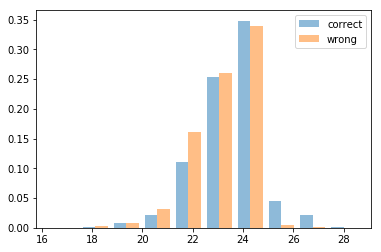

In [10]:
bins = [35,45,55,60,65,70]
plt.hist([correct_scroes,wrong_scores], 10, alpha=0.5, label=['correct','wrong'],density=True)
# plt.hist(wrong_scores, 10, alpha=0.5, label='wrong')
plt.legend(loc='upper right')
# plt.show()

In [11]:
# check unigrams intersection with other relations, both on tokens and entities
# on train as well
for d in result_per_type['member of'][1]:
    show_set(d)
    print()
    

head: papua new guinea   ,   tail asia-pacific economic cooperation
member of	 papua new guinea became a participating economy in the Asia - Pacific Economic Cooperation ( APEC ) Forum in 1993 .

head: milking   ,   tail animal husbandry
part of	 The milking process is the collection of tasks specifically devoted to extracting milk from an animal ( rather than the broader field of dairy animal husbandry ) . 0.02; 20.32
head: oman   ,   tail gulf cooperation council
member of	 During a 2015 Camp David summit with the gulf cooperation council states , the Obama administration considered designating Saudi Arabia , the United Arab Emirates , oman , and Qatar as MNNAs .  0.83; 23.91
head: inanna   ,   tail ningal
mother	 ningal was the wife of Nanna , as well as the mother of Utu , inanna , and Ereshkigal .  0.05; 21.17
head: mohammed vi bridge   ,   tail bouregreg
crosses	 The mohammed vi bridge ( Arabic : جسر محمد السادس ) is a cable - stayed bridge that spans the valley of the bouregreg 

head: augustinus   ,   tail pelagianism
main subject	 In 1628 , Cornelius Jansen , a professor at Leuven , began writing " augustinus " , a three volume treatise on Augustine of Hippo which conflated Jesuits with pelagianism by highlighting Augustine 's propositions .  0.04; 21.23
head: kottapeta rowdy   ,   tail telugu
original language of film or TV show	 kottapeta rowdy is a telugu film starring Krishna , Jayaprada & Chiranjeevi .  0.01; 20.05
head: emilio naudin   ,   tail tenor
voice type	 emilio naudin , born in Parma on 23 October 1823 , died in Bologna on 5 May 1890 , was an Italian tenor .  0.01; 19.72


head: brown university   ,   tail ivy league
member of	 The brown university School of Engineering is the engineering school at brown university , a private ivy league research university located in Providence , Rhode Island .

head: hogun   ,   tail warriors three
member of	 Against Odin 's order , Thor travels to Jotunheim to confront Laufey , accompanied by his brother Loki

head: seema   ,   tail hindi
original language of film or TV show	 His daughter Shubha Khote acted in hindi films ; debuting in " seema " ( 1955 ) , she later directed and produced Marathi films and entered television in the 90s .  0.01; 20.33
head: matilda   ,   tail engelbert iii of gorizia
spouse	 He was the son of Count engelbert iii of gorizia and his wife matilda , a sister of the Andechs duke Berthold IV of Merania .  0.05; 21.89
head: 2008 r2   ,   tail windows server 2008
follows	 Windows Vista , Windows 7 , windows server 2008 and 2008 r2 also support IPP printing over RPC in the " Medium - Low " security zone .  0.00; 16.73
head: first season   ,   tail glee
part of	 During the first season of " glee " , the show paid tribute to Madonna with the episode " The Power of Madonna " .  0.00; 16.95


head: fran healy   ,   tail travis
member of	 At the Ivor Novello Awards , travis frontman fran healy won the awards for Best Songwriter(s ) and Best Contemporary Song for " Why Does 

head: jane wilde   ,   tail oscar wilde
child	 In London , she had the opportunity through jane wilde to meet oscar wilde , her son .  0.14; 21.24
head: 1929   ,   tail 1924
follows	 In 1923 , Stewart went to work for the Comintern in Moscow , but stood in Dundee at the 1924 , 1929 and 1931 general elections - in 1931 , he took 10,261 votes .  0.04; 19.97
head: interstate 635 bridge   ,   tail kansas river
crosses	 The interstate 635 bridge is an automobile crossing of the kansas river in Kansas City , Kansas .  0.17; 21.44
head: shazam   ,   tail marvel family
member of	 " The marvel family " # 7 ( 1946 ) Later retellings of the Captain Marvel origin place shazam 's underground lair within the Rock .  0.55; 22.62


head: peter doherty   ,   tail the libertines
member of	 peter doherty , lead singer of the libertines , worked at the cinema for several months in 1999 before being dismissed .

head: antiparos   ,   tail aegean
located in or next to body of water	 Certain central aegean i

head: windows   ,   tail dos
follows	 windows , dos , some CP / M programs , OpenVMS , and OS/2 all use the slash to indicate command - line options .  0.01; 20.12


head: chris caffery   ,   tail savatage
member of	 Special guests of the night were former - Iron Maiden singer Blaze Bayley and guitarist chris caffery ( savatage , Trans - Siberian Orchestra ) .

head: sambarala rambabu   ,   tail telugu
original language of film or TV show	 This film was remade in telugu in 1970 titled sambarala rambabu starring Chalam and Sharada . 0.27; 23.27
head: epsilon   ,   tail taurus
constellation	 Four of these stars , with Bayer designations Gamma , Delta 1 , epsilon , and Theta Tauri , form an asterism that is traditionally identified as the head of taurus the Bull .  0.01; 19.96
head: honiara   ,   tail pacific
located in or next to body of water	 It has also been reported from Sabah , Malaysia and honiara , Solomon Islands which suggests a wide distribution in the central Indo - pacific re

In [12]:
def show_statson_all_relation(correct = 0):
    pred_acc = []
    scores_result = []
    std_result = [] 
    for k,v in result_per_type.items():
        scores_category = np.array(list(map(lambda x: x['scores'][int(x['prediction'])],v[correct])))
        pred_acc.append(len(v[1])/(len(v[0])+len(v[1]))*100)
        scores_result.append(scores_category.mean())
        std_result.append(scores_category.std())
        print(f"{k}:\t {scores_category.mean():.2f} +- {scores_category.std():.2f} ; {len(v[1])/(len(v[0])+len(v[1]))*100:.2f}%")
    #     print( k ,scores_category.mean(), "+-",scores_category.std(), " Acc is:", len(v[1])/(len(v[0])+len(v[1])))
    pred_acc = np.array(pred_acc)
    scores_result = np.array(scores_result)
    std_result = np.array(std_result)
#     X = np.stack((pred_acc,scores_result),axis=0)
#     print(np.cov(X))
#     print(np.corrcoef(np.stack((pred_acc,scores_result),axis=0)))
    return pred_acc,scores_result,std_result

In [13]:
pred_acc,scores_result_correct,std_result_correct = show_statson_all_relation(1)

member of:	 23.67 +- 1.17 ; 24.43%
crosses:	 24.00 +- 0.82 ; 92.02%
part of:	 22.31 +- 1.42 ; 34.81%
mother:	 23.55 +- 0.91 ; 30.62%
child:	 23.50 +- 0.86 ; 31.41%
main subject:	 22.71 +- 0.86 ; 58.39%
military rank:	 24.24 +- 0.44 ; 56.11%
located in or next to body of water:	 23.15 +- 0.87 ; 71.75%
voice type:	 23.98 +- 0.49 ; 45.57%
follows:	 22.19 +- 1.79 ; 47.03%
original language of film or TV show:	 22.71 +- 0.79 ; 45.77%
position played on team / speciality:	 24.03 +- 0.45 ; 43.58%
spouse:	 23.62 +- 0.95 ; 33.33%
competition class:	 23.97 +- 0.51 ; 44.53%
constellation:	 24.39 +- 1.71 ; 80.44%
sport:	 23.49 +- 1.30 ; 23.84%


In [14]:
from scipy.stats import pearsonr


In [15]:
pearsonr(pred_acc,scores_result_correct)


(0.23652920694937998, 0.37778694613449376)

In [16]:
pred_acc,scores_result_wrong,std_result_wrong = show_statson_all_relation(0)

member of:	 23.28 +- 1.12 ; 24.43%
crosses:	 22.38 +- 1.03 ; 92.02%
part of:	 22.24 +- 1.07 ; 34.81%
mother:	 23.43 +- 0.90 ; 30.62%
child:	 23.43 +- 0.88 ; 31.41%
main subject:	 22.50 +- 0.94 ; 58.39%
military rank:	 23.98 +- 0.76 ; 56.11%
located in or next to body of water:	 22.81 +- 0.79 ; 71.75%
voice type:	 23.92 +- 0.65 ; 45.57%
follows:	 22.03 +- 1.23 ; 47.03%
original language of film or TV show:	 22.74 +- 0.74 ; 45.77%
position played on team / speciality:	 23.96 +- 0.61 ; 43.58%
spouse:	 23.54 +- 0.86 ; 33.33%
competition class:	 23.75 +- 0.74 ; 44.53%
constellation:	 22.66 +- 0.74 ; 80.44%
sport:	 22.92 +- 1.65 ; 23.84%


In [17]:
pearsonr(pred_acc,scores_result_wrong)

(-0.33705359667334, 0.20174186365778013)

In [18]:
from sklearn.metrics import confusion_matrix
mapping_rel_to_index = {}
for i,r in enumerate(result_per_type.keys()):
    mapping_rel_to_index[r] = i

In [19]:
labels = [x for x in result_per_type.keys()]
cm = confusion_matrix(gold_list, pred_list, labels)
print(cm)
lcm = [[np.log1p(x) for x in row] for row in cm ]



[[150   3  28  43  39  17  57  24  62  10  25  44  30  27  27  28]
 [  5 611   9   1   4   6   0   7   3   1   1   4   3   1   8   0]
 [ 20  37 212  20  24  50   3  56   7  49  50   8  11   6  36  20]
 [ 45   4  14 184  43  12  29  15  52  12  22  44  42  41  17  25]
 [ 38   5  15  40 196  10  56  16  52  10  14  55  41  35  14  27]
 [ 12   8  27  17  15 341   4  16   4  40  42   4   8   3  36   7]
 [ 31   5   5  28  20   3 358   4  41   3   4  38  20  40   2  36]
 [ 13  18  18  17  17  20   3 475   4  11  16   5   6   9  24   6]
 [ 42   1   0  32  31   1  68   2 283   2   5  59  30  39   2  24]
 [ 16   6  35  22  12  76   2  22   4 301  44   8  20   8  50  14]
 [ 20   1  28  34  38  37  14  26  17  25 276  14  15  13  27  18]
 [ 39   0   7  33  32   3  64   5  49   0   5 268  23  44   3  40]
 [ 32   3   8  56  42   8  56  18  43   5  15  49 212  39  16  34]
 [ 36   3   4  23  29   4  63   4  65   4   1  52  38 297   7  37]
 [ 13   4  11   8  12  12   2  16   2  12  14   3   9   1 514 

[Text(0, 0.5, 'member o'),
 Text(0, 1.5, 'crosses'),
 Text(0, 2.5, 'part of'),
 Text(0, 3.5, 'mother'),
 Text(0, 4.5, 'child'),
 Text(0, 5.5, 'main sub'),
 Text(0, 6.5, 'military'),
 Text(0, 7.5, 'located '),
 Text(0, 8.5, 'voice ty'),
 Text(0, 9.5, 'follows'),
 Text(0, 10.5, 'original'),
 Text(0, 11.5, 'position'),
 Text(0, 12.5, 'spouse'),
 Text(0, 13.5, 'competit'),
 Text(0, 14.5, 'constell'),
 Text(0, 15.5, 'sport')]

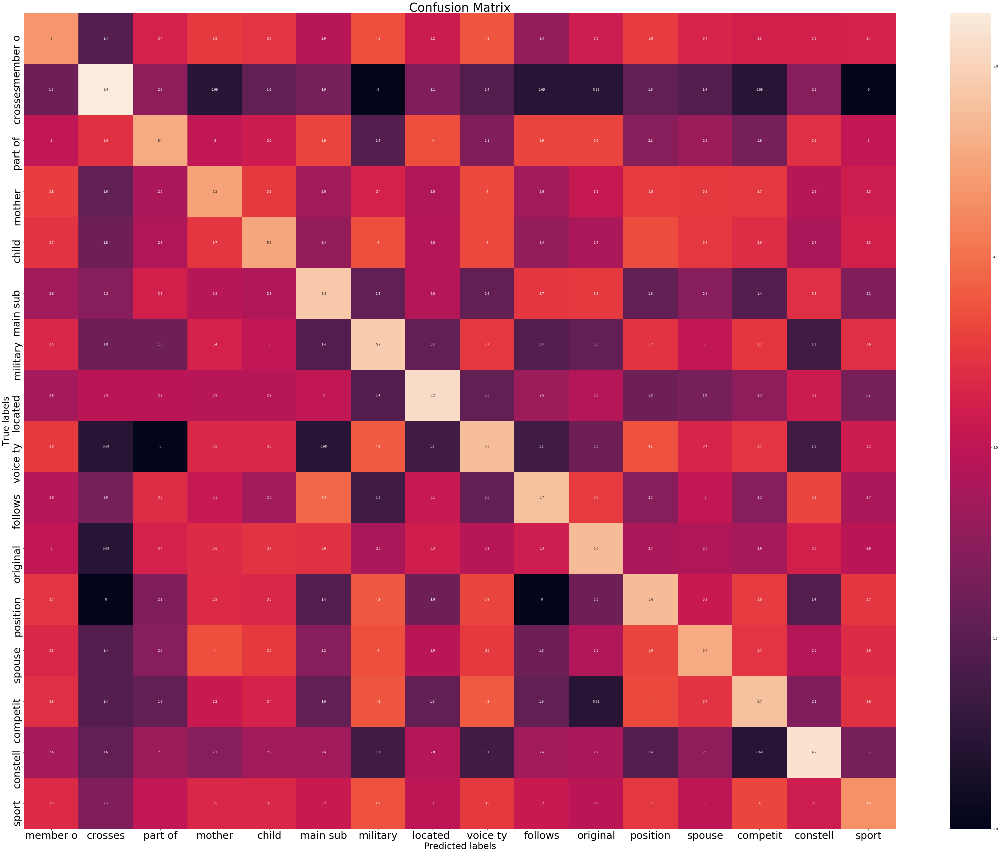

In [20]:
import seaborn as sns

fig = plt.figure(figsize=(65,50))
# ax = fig.add_subplot(111)
ax= plt.subplot()
sns.heatmap(lcm, annot=True, ax = ax) #annot=True to annotate cells
# sns.set(font_scale=-4.4)
# labels, title and ticks

ax.set_xlabel('Predicted labels',fontsize=30);ax.set_ylabel('True labels',fontsize=30); 
ax.set_title('Confusion Matrix',fontsize=40); 
ax.xaxis.set_ticklabels([x[:8] for x in result_per_type.keys()],fontsize=34)
ax.yaxis.set_ticklabels([x[:8] for x in result_per_type.keys()],fontsize=34)



In [21]:
this_dict = {}
for k,v in wrong_prediction_which_rel.items():
    this_dict[k] = [rel_type for rel_type,count in v.most_common()[:5]]
this_dict

{'member of': ['voice type',
  'military rank',
  'position played on team / speciality',
  'mother',
  'child'],
 'mother': ['voice type',
  'member of',
  'position played on team / speciality',
  'child',
  'spouse'],
 'child': ['military rank',
  'position played on team / speciality',
  'voice type',
  'spouse',
  'mother'],
 'located in or next to body of water': ['constellation',
  'main subject',
  'crosses',
  'part of',
  'mother'],
 'voice type': ['military rank',
  'position played on team / speciality',
  'member of',
  'competition class',
  'mother'],
 'original language of film or TV show': ['child',
  'main subject',
  'mother',
  'part of',
  'constellation'],
 'military rank': ['voice type',
  'competition class',
  'position played on team / speciality',
  'sport',
  'member of'],
 'follows': ['main subject',
  'constellation',
  'original language of film or TV show',
  'part of',
  'located in or next to body of water'],
 'part of': ['located in or next to body of

In [ ]:
# check agremment with the model prediction 
# try to come up with b=new baselines to show that data is no good
# Elmo should do worse?
# only entity type is helpful?
